In [1]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)


1.13.1
0.13.1


In [2]:
!pip install boto3

In [58]:
import numpy as np
import wave

import io
import os
import tarfile
import tempfile

import boto3
import matplotlib.pyplot as plt
import requests
from botocore import UNSIGNED
from botocore.config import Config
from IPython.display import Audio
from torchaudio.utils import download_asset 

SAMPLE_GSM = download_asset("tutorial-assets/steam-train-whistle-daniel_simon.gsm")
SAMPLE_WAV = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")
SAMPLE_WAV_8000 = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042-8000hz.wav")
Long_sample_MP3 = "/Users/werther/AudioSample/Eminem_Rap_God_Explicit.mp3"
Long_sample_WAV = "/Users/werther/AudioSample/Eminem_Rap_God_Explicit.wav"
Short_sample_WAV = "/Users/werther/AudioSample/OLIVER_muted_guitar_90_D.wav"

In [4]:
metadata = torchaudio.info(SAMPLE_WAV)
print(metadata)

AudioMetaData(sample_rate=16000, num_frames=54400, num_channels=1, bits_per_sample=16, encoding=PCM_S)


In [5]:
metadata = torchaudio.info(SAMPLE_GSM)
print(metadata)

AudioMetaData(sample_rate=8000, num_frames=0, num_channels=1, bits_per_sample=0, encoding=GSM)


In [6]:
url = "https://download.pytorch.org/torchaudio/tutorial-assets/steam-train-whistle-daniel_simon.wav"
with requests.get(url, stream=True) as response:
    metadata = torchaudio.info(response.raw)
print(metadata)

AudioMetaData(sample_rate=44100, num_frames=109368, num_channels=2, bits_per_sample=16, encoding=PCM_S)


In [55]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV)
print(waveform.shape)
print(sample_rate)

torch.Size([1, 54400])
16000


In [57]:
print(waveform[0])

tensor([0.0183, 0.0180, 0.0180,  ..., 0.0018, 0.0019, 0.0032])


In [8]:
def plot_waveform(waveform, sample_rate):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
    figure.suptitle("waveform")
    plt.show(block=False)

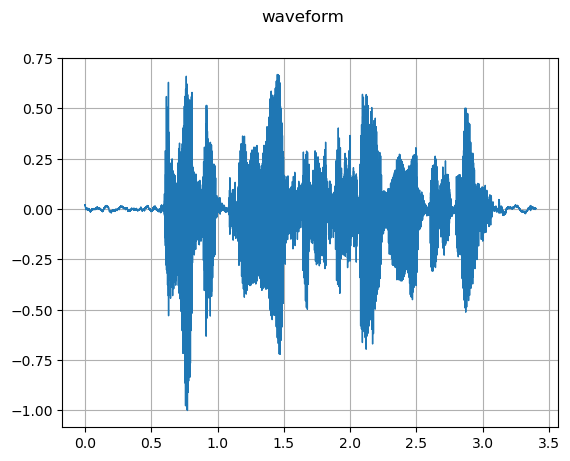

In [9]:
plot_waveform(waveform, sample_rate)

In [14]:
def plot_specgram(waveform, sample_rate, title="Spectrogram"):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
    figure.suptitle(title)
    plt.show(block=False)

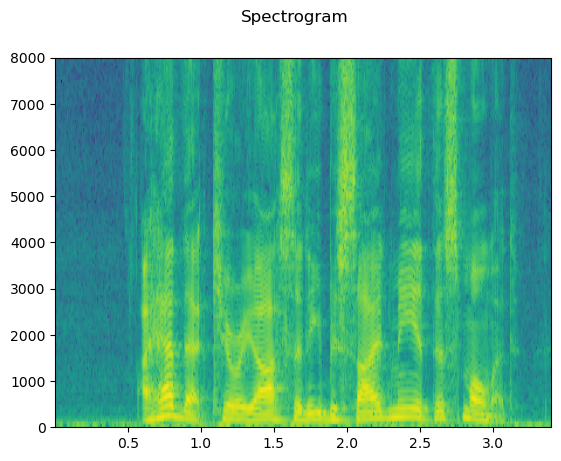

In [15]:
plot_specgram(waveform, sample_rate)

In [54]:
Audio(waveform.numpy()[0], rate=sample_rate)

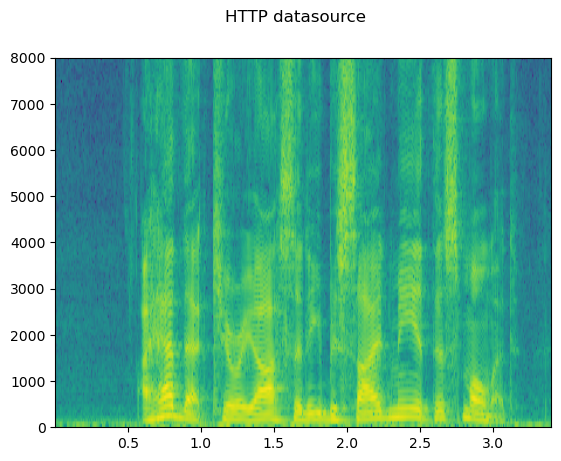

In [53]:
# Load audio data as HTTP request
url = "https://download.pytorch.org/torchaudio/tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"
with requests.get(url, stream=True) as response:
    waveform, sample_rate = torchaudio.load(response.raw)
plot_specgram(waveform, sample_rate, title="HTTP datasource")

In [19]:
from IPython.display import Audio, display

In [20]:
display(Audio(SAMPLE_WAV))

In [49]:
waveform, sample_rate = torchaudio.load(Long_sample_MP3)
print(waveform.shape)
print(sample_rate)
np1 = np.array(waveform[0])
print(np.unique(np1))

torch.Size([2, 16283648])
44100
[-0.6787729  -0.6571778  -0.64951146 ...  0.6515701   0.68165004
  0.7486781 ]


In [52]:
display(Audio(Long_sample_MP3))

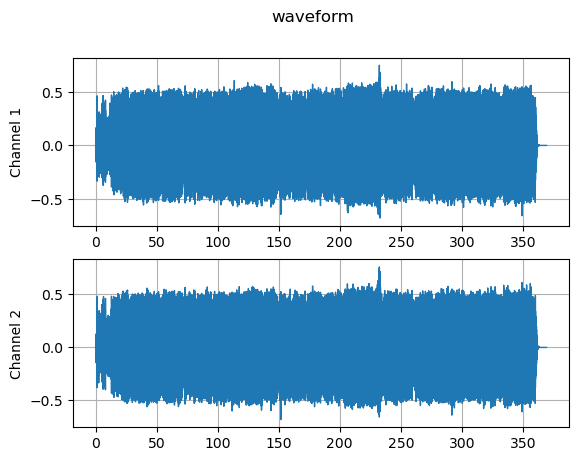

In [42]:
plot_waveform(waveform, sample_rate)

In [48]:
waveform, sample_rate = torchaudio.load(Short_sample_WAV)
print(waveform.shape)
print(sample_rate)
np1 = np.array(waveform[0])
print(np.unique(np1))

torch.Size([2, 470400])
44100
[-0.5411962  -0.53552556 -0.5317793  ...  0.84026897  0.85605454
  0.8664365 ]


torch.Size([2, 470400])
44100
[-0.5411962  -0.53552556 -0.5317793  ...  0.84026897  0.85605454
  0.8664365 ]


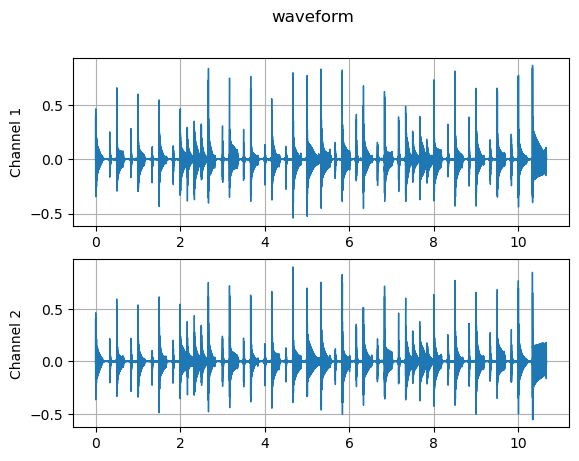

In [65]:
waveform, sample_rate = torchaudio.load(Short_sample_WAV)
print(waveform.shape)
print(sample_rate)
np1 = np.array(waveform[0])
print(np.unique(np1))

display(Audio(Short_sample_WAV))

plot_waveform(waveform, sample_rate)

In [70]:
import pyaudio
import wave
import random

# Set up the audio stream.
p = pyaudio.PyAudio()
stream = p.open(format=pyaudio.paInt16, channels=1, rate=44100, output=True)

# Load the drum sounds.
kick_sound = wave.open('kick.wav', 'rb')
snare_sound = wave.open('snare.wav', 'rb')
hihat_sound = wave.open('hihat.wav', 'rb')

# Define the drum beat.
kick_pattern = [1, 0, 0, 0, 1, 0, 0, 0]
snare_pattern = [0, 0, 1, 0, 0, 0, 1, 0]
hihat_pattern = [1, 1, 1, 1, 1, 1, 1, 1]

# Generate the drum beat.
while True:
    for i in range(8):
        if kick_pattern[i]:
            stream.write(kick_sound.readframes(44100))
        if snare_pattern[i]:
            stream.write(snare_sound.readframes(44100))
        if hihat_pattern[i]:
            stream.write(hihat_sound.readframes(44100))

# Clean up.
stream.stop_stream()
stream.close()
p.terminate()






ModuleNotFoundError: No module named 'pyaudio'